In [1]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np


np.random.seed(42)



In [17]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


2023-04-18 22:34:52.764179: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1956] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


## Hyperparameters and Constants

Here, we define wether to train the model or not and for how many epochs to train for.

If `TRAIN = False`, then the last trained model will be used for inference in the notebook if run end to end.

In [25]:
TRAIN = True
# Number of epochs to train for.
EPOCHS = 120

In [3]:
# DON NOT RUN THIS 

"""
if not os.path.exists('train'):
    !curl -L "https://public.roboflow.com/ds/xKLV14HbTF?key=aJzo7msVta" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
    
    dirs = ['train', 'valid', 'test']

    for i, dir_name in enumerate(dirs):
        all_image_names = sorted(os.listdir(f"{dir_name}/images/"))
        for j, image_name in enumerate(all_image_names):
            if (j % 2) == 0:
                file_name = image_name.split('.jpg')[0]
                os.remove(f"{dir_name}/images/{image_name}")
                os.remove(f"{dir_name}/labels/{file_name}.txt")

"""


The original data had two instances of each image and label file. The rest of the code in the above block deletes the duplicate image and it's corresponding text file containing the label.

The dataset is structured in the following manner:

```
├── data.yaml
├── README.dataset.txt
├── README.roboflow.txt
├── test
│   ├── images
│   └── labels
├── train
│   ├── images
│   └── labels
└── valid
    ├── images
    └── labels

```

## Helper Functions to Download Files

The following function is for downloading any file in the notebook. In further sections of the notebook, we will use it for downloading the inference data.

In [4]:
def download_file(url, save_name):
    url = url
    if not os.path.exists(save_name):
        file = requests.get(url)
        open(save_name, 'wb').write(file.content)
    else: 
        print('File already present, skipping download...')

### The Dataset YAML File

The dataset YAML (`data.yaml`) file containing the path to the training and validation images and labels is already provided. This file will also contain the class names from the dataset.

The dataset contains 5 classes: **'Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck'**.

The following block shows the contents of the `data.yaml` file.

```yaml
train: ../train/images
val: ../valid/images

nc: 5
names: ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']
```

### Visualize a Few Ground Truth Images

Before moving forward, let's check out few of the ground truth images. 

The current annotations in the text files are in normalized `[x_center, y_center, width, height]` format. Let's write a function that will convert it back to `[x_min, y_min, x_max, y_max]` format.

In [3]:
class_names = [ 'cap']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [4]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [5]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin
        
        class_name = class_names[int(labels[box_num])]
        
        cv2.rectangle(
            image, 
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        ) 

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))
        
        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name, 
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image, 
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image, 
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [6]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()
    
    num_images = len(all_training_images)
    
    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

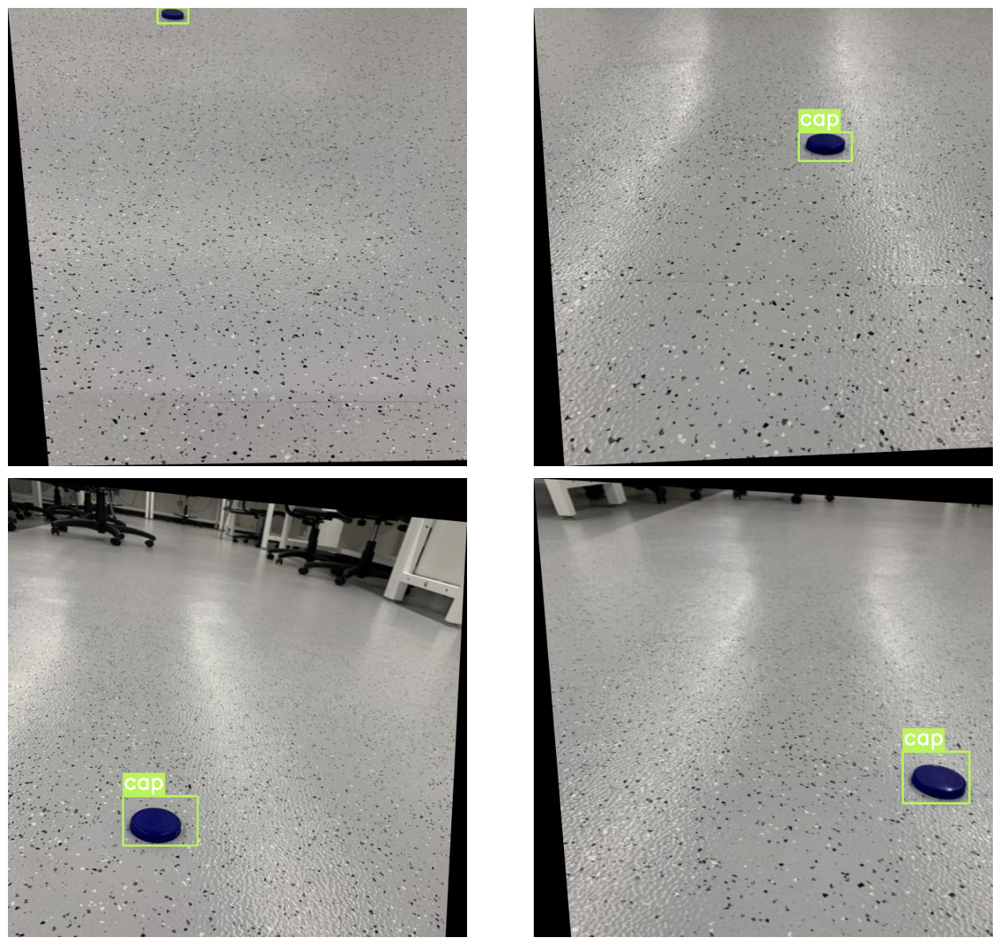

In [7]:
# Visualize a few training images.
plot(
    image_paths='train/images/*', 
    label_paths='train/labels/*',
    num_samples=4,
)

## Helper Functions for Logging

Here, we write the helper functions that we need for logging of the results in the notebook while training the models.

Let's create our custom result directories so that we can easily keep track of them and carry out inference using the proper model.

In [8]:
# nothing is overwritten
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

**Function to Monitor TensorBoard logs**.

In [9]:
def monitor_tensorboard():
    %load_ext tensorboard
    %tensorboard --logdir runs/train

## Clone YOLOV5 Repository

In [10]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git

In [11]:
%cd yolov5/
!pwd

/blue/eel5840/nplatonoff/YoloModel/yolov5
/blue/eel5840/nplatonoff/YoloModel/yolov5


In [27]:
#!pip install -r requirements.txt

## Training using YOLOV5

The next step is to train the neural network model.

### Train a Small (yolov5s) Model

Training all the layers of the small model.

In [13]:


monitor_tensorboard()


ERROR: Could not find `tensorboard`. Please ensure that your PATH
contains an executable `tensorboard` program, or explicitly specify
the path to a TensorBoard binary by setting the `TENSORBOARD_BINARY`
environment variable.

In [29]:
os.environ['TENSORBOARD_BINARY'] ='~/blueEEL5840/nplatonoff/conda/envs/yolo52/bin'

In [22]:
#%%python -m tensorboard.main --logdir='runs/train'
#%tensorboard --logdir runs/train

UsageError: Line magic function `%python` not found (But cell magic `%%python` exists, did you mean that instead?).


In [34]:
#PATH = os.getenv('PATH')
#%env PATH=/Users/anto/miniconda3/envs/tf2_env/bin:$PATH

#%env PATH=~/blueEEL5840/nplatonoff/conda/envs/yolo52/bin:$PATH

#%reload_ext tensorboard
#%tensorboard --logdir runs/train



env: PATH=~/blueEEL5840/nplatonoff/conda/envs/yolo52/bin:~/blueEEL5840/nplatonoff/conda/envs/yolo52/bin:~/blueEEL5840/nplatonoff/conda/envs/yolo52/bin:~/blueEEL5840/nplatonoff/conda/envs/yolo52/bin/tensorboard:~/blueEEL5840/nplatonoff/conda/envs/yolo52/bin:~/blueEEL5840/nplatonoff/conda/envs/yolo52/bin:/apps/jupyter/6.5.2/bin:/apps/ufrc/ufhpc/bin:/apps/git/2.30.1/bin:/opt/slurm/bin:/usr/lib64/qt-3.3/bin:/usr/local/cuda/bin:/opt/bin:/usr/local/bin:/bin:/usr/bin:/usr/local/sbin:/usr/sbin:/opt/puppetlabs/bin:/home/nplatonoff/bin


ERROR: Could not find '~/blueEEL5840/nplatonoff/conda/envs/yolo52/bin'
(set by the `TENSORBOARD_BINARY` environment variable). Please ensure
that your PATH contains an executable `tensorboard` program, or
explicitly specify the path to a TensorBoard binary by setting the
`TENSORBOARD_BINARY` environment variable.

In [15]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 0
results_1
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=90, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_1, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /blue/eel5840/nplatonoff/YoloModel/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.10.4 torch-2.0.0+cu117 CUDA:0 (NVIDIA A100-SXM4-80GB, 81251MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_

## Check Out the Validation Predictions and Inference

In this section, we will check out the predictions of the validation images saved during training. Along with that, we will also check out inference of images and videos.

### Visualization and Inference Utilities

We will visualize the validation prediction images that are saved during training. The following is the function for that.

In [16]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

The following functions are for carrying out inference on images and videos.

In [17]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

We may also need to visualize images in any of the directories. The following function accepts a directory path and plots all the images in them. 

In [18]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

**Visualize validation prediction images.**

confusion_matrix.png	P_curve.png	  train_batch1.jpg
F1_curve.png		PR_curve.png	  train_batch2.jpg
hyp.yaml		R_curve.png	  val_batch0_labels.jpg
labels_correlogram.jpg	results.csv	  val_batch0_pred.jpg
labels.jpg		results.png	  weights
opt.yaml		train_batch0.jpg
['runs/train/results_1/val_batch0_pred.jpg']


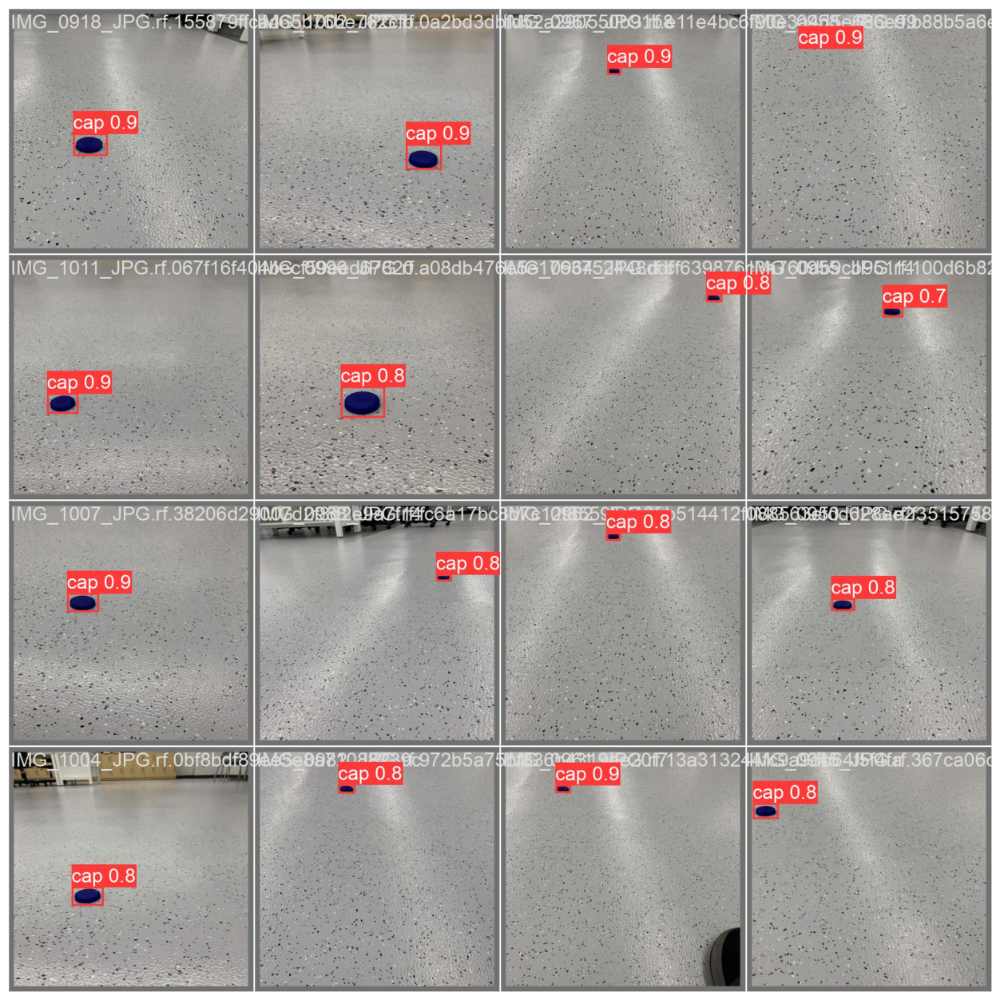

In [19]:
show_valid_results(RES_DIR)

### Inference
In this section, we will carry out inference on unseen images and videos from the internet. 

The images for inference are in the `inference_images` directory.

The videos for inference are in the `inference_videos` directory.

### Download the Images and Videos
Let's download the images and videos that we will carry inference upon.

In [21]:

"""

download_file('https://learnopencv.s3.us-west-2.amazonaws.com/yolov5_inference_data.zip',
              'inference_data.zip')
if not os.path.exists('inference_images'):
    !unzip -q "inference_data.zip"
else:
    print('Dataset already present')

File already present, skipping download...
Dataset already present


### Inference on Images

**To carry out inference on images, we just need to provide the directory path where all the images are stored, and inference will happen on all images automatically.**

In [22]:
# Inference on images.
IMAGE_INFER_DIR = inference(RES_DIR, '../test/imageNew')

Current number of inference detection directories: 1
inference_2
detect: weights=['runs/train/results_1/weights/best.pt'], source=../test/imageNew, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_2, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /blue/eel5840/nplatonoff/YoloModel/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.10.4 torch-2.0.0+cu117 CUDA:0 (NVIDIA A100-SXM4-80GB, 81251MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /blue/eel5840/nplatonoff/YoloModel/test/imageNew/HRMZ7225.JPG: 640x480 2 caps, 32.6ms
Speed: 0.4ms pre-process, 32.6ms inference, 1.3ms NMS per image at shap

In [23]:
visualize(IMAGE_INFER_DIR)

[]


### Inference on Videos

In [24]:
inference(RES_DIR, '../test/video')

Current number of inference detection directories: 2
inference_3
detect: weights=['runs/train/results_1/weights/best.pt'], source=../test/video, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_3, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /blue/eel5840/nplatonoff/YoloModel/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.10.4 torch-2.0.0+cu117 CUDA:0 (NVIDIA A100-SXM4-80GB, 81251MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/303) /blue/eel5840/nplatonoff/YoloModel/test/video/capVid.mp4: 384x640 1 cap, 36.1ms
video 1/1 (2/303) /blue/eel5840/nplatonoff/YoloModel/test/video/capVid.m

'inference_3'

## Training and Inference using  Medium Model

In [25]:
monitor_tensorboard()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 13752), started 0:14:09 ago. (Use '!kill 13752' to kill it.)

In [26]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5n.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 1
results_2
train: weights=yolov5n.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=120, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_2, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /blue/eel5840/nplatonoff/YoloModel/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-147-gaa7c45c Python-3.10.4 torch-2.0.0+cu117 CUDA:0 (NVIDIA A100-SXM4-80GB, 81251MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup

In [27]:
# Inference on images.
IMAGE_INFER_DIR = inference(RES_DIR, 'inference_images')

Current number of inference detection directories: 2
inference_3
detect: weights=['runs/train/results_2/weights/best.pt'], source=inference_images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_3, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (NVIDIA GeForce GTX 1060, 6078MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients
image 1/4 /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_images/image_1.jpg: 448x640 2 Ambulances, 1 Car, 4 Trucks, Done. (0.021s)
image 2/4 /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detect

['runs/detect/inference_3/image_1.jpg', 'runs/detect/inference_3/image_4.jpg', 'runs/detect/inference_3/image_2.jpg', 'runs/detect/inference_3/image_3.jpg']


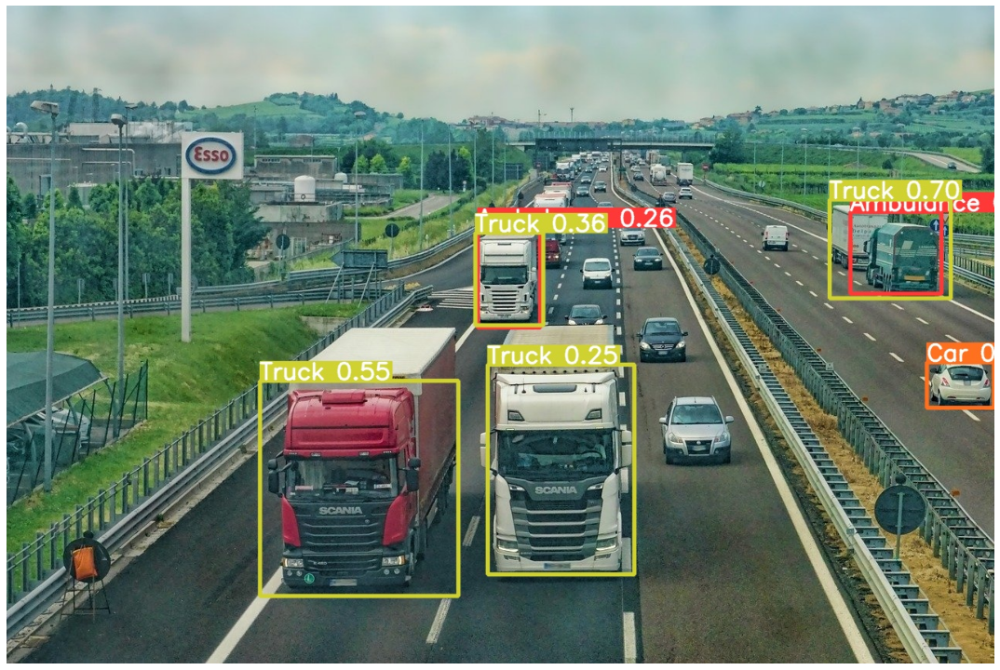

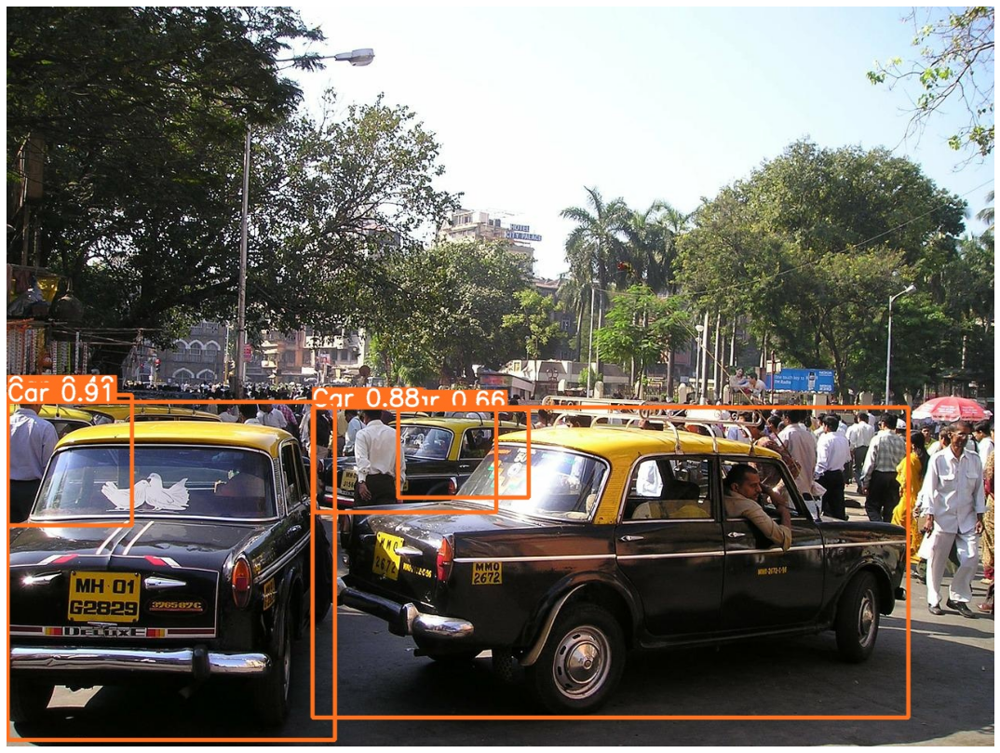

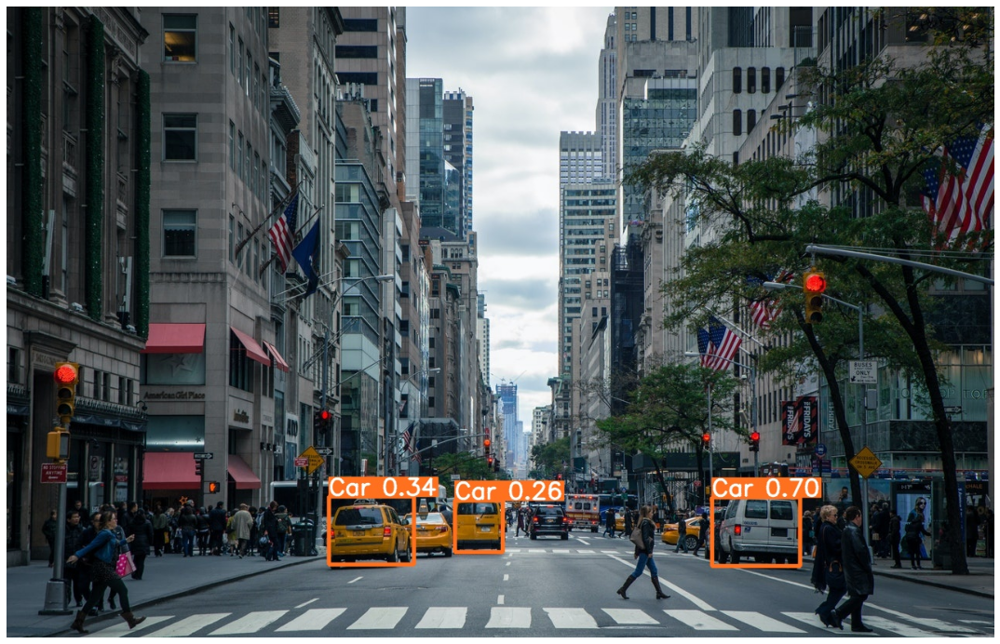

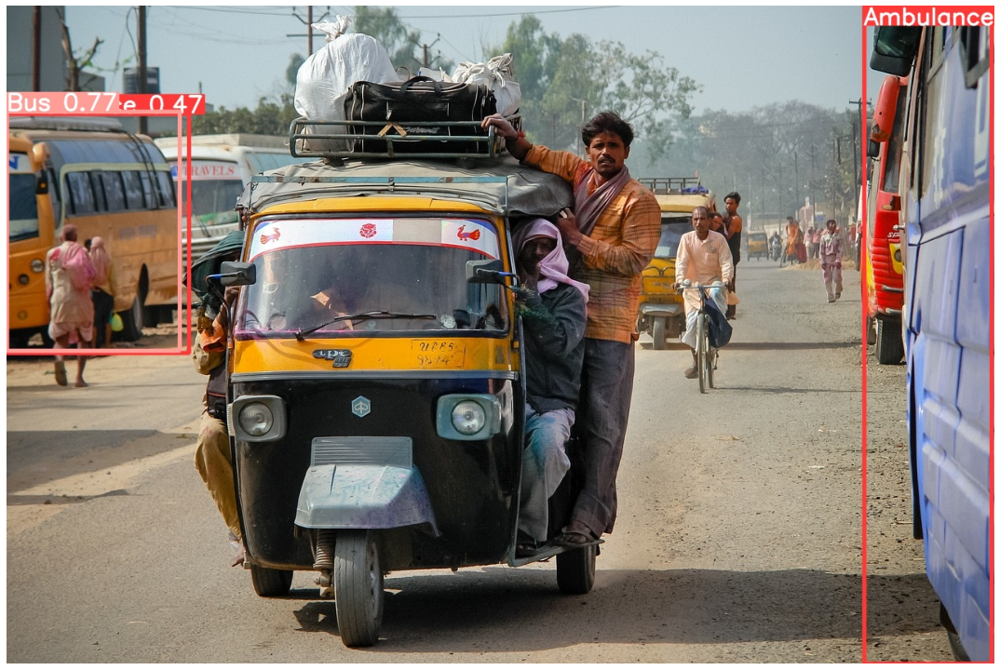

In [28]:
visualize(IMAGE_INFER_DIR)

In [29]:
inference(RES_DIR, 'inference_videos')

Current number of inference detection directories: 3
inference_4
detect: weights=['runs/train/results_2/weights/best.pt'], source=inference_videos, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_4, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (NVIDIA GeForce GTX 1060, 6078MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients
video 1/4 (1/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.030s)
video 1/4 (2/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_us

'inference_4'

## Freezing Layers and Training the Medium Model

The Medium model (yolov5m) contains 25 blocks layers in total more than 20 million parameters. We need not train all the layers. Let's freeze a few layers and train again. This will result in faster iteration per epoch. Here, we freeze the first 15 blocks.

In [30]:
monitor_tensorboard()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 13752), started 0:47:16 ago. (Use '!kill 13752' to kill it.)

In [31]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5m.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR} \
    --freeze 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14

Current number of result directories: 2
results_3
train: weights=yolov5m.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_3, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 27 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (NVIDIA GeForce GTX 1060, 6078MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_m

In [32]:
# Inference on images.
IMAGE_INFER_DIR = inference(RES_DIR, 'inference_images')

Current number of inference detection directories: 4
inference_5
detect: weights=['runs/train/results_3/weights/best.pt'], source=inference_images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_5, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (NVIDIA GeForce GTX 1060, 6078MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients
image 1/4 /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_images/image_1.jpg: 448x640 3 Buss, 5 Cars, Done. (0.021s)
image 2/4 /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_us

In [34]:
inference(RES_DIR, 'inference_videos')

Current number of inference detection directories: 5
inference_6
detect: weights=['runs/train/results_3/weights/best.pt'], source=inference_videos, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_6, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (NVIDIA GeForce GTX 1060, 6078MiB)

Fusing layers... 
Model summary: 290 layers, 20869098 parameters, 0 gradients
video 1/4 (1/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_using_yolov5/UPDATED_code/yolov5/inference_videos/video_1.mp4: 384x640 Done. (0.019s)
video 1/4 (2/513) /home/sovit/my_data/Data_Science/Big_Vision/my_blogs/custom_object_detection_training_us

'inference_6'